# **🐶End-to-end  Multi-class Dog Breed Classification **

* Name: Suprasanna V Gunaga
* BE Information Science & Engineering ,RNSIT Bengaluru (2021-2025)


In [230]:
# !unzip "drive/MyDrive/Dog vision/dog-breed-identification.zip" -d "drive/MyDrive/DogVision/"

In [95]:
#Import TensorFlow
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.14.0


In [96]:
#Importing tools
import tensorflow_hub as hub
print("TF HUB version:", hub.__version__)

print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "not available")

TF HUB version: 0.15.0
GPU Available


##Getting data ready (Turning into Tensors)

---



In [139]:
#Check out the labels of data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [98]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [99]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

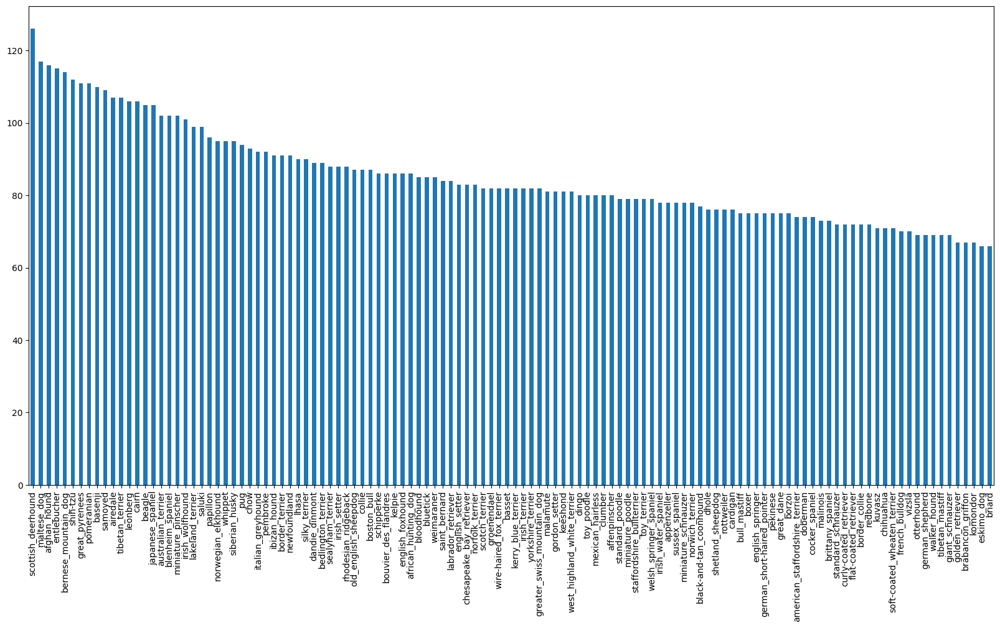

In [100]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

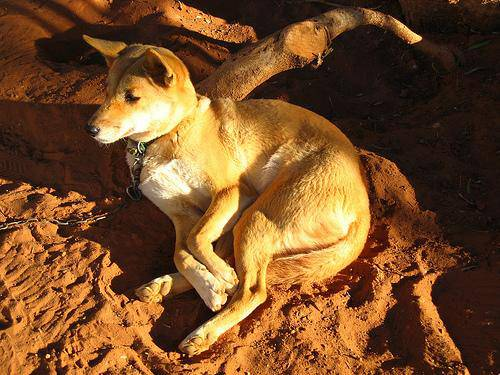

In [140]:
from IPython.display import Image
Image("drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

# Getting images and their labels
Getting a list of all images file pathnames

In [141]:
#creating pathnames from image ID's
filenames=["drive/MyDrive/DogVision/train/"+fname+ ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [142]:
import os
if len(os.listdir("drive/MyDrive/DogVision/train/"))==len(filenames):
  print("Matched")
else:
  print("Not matched")
print(len(os.listdir("drive/MyDrive/DogVision/train/")))
print(len(filenames))
print(len(os.listdir("drive/MyDrive/DogVision/test/")))

Matched
10222
10222
10357


# Turning data labels into numbers


In [143]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels,len(labels)


(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [105]:
len(labels)

10222

In [144]:
# Finding the unique label value
unique_breeds=np.unique(labels)
len(unique_breeds),unique_breeds[0:5]


(120,
 array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier'], dtype=object))

In [145]:
#Turning every label into boolean array
bool_labels=[label == unique_breeds for label in labels]
bool_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [108]:
len(bool_labels)


10222

In [146]:
# turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds==labels[0]))
print(bool_labels[0].argmax())
print(bool_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [147]:
print(labels[2])
print(bool_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating validation set

In [148]:
X=filenames
y=bool_labels

In [149]:
len(filenames),len(bool_labels)


(10222, 10222)

In [113]:
#Setting number of images to use for experimenting
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000}

In [151]:
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [152]:
X_train[:5],y_train[:2]

(['drive/MyDrive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

# Peprocessing Images (Turning images into Tensors)
Steps:

1.Takes an image filename as input.

2.Uses TensorFlow to read the file and save it to a variable, image.

3.Turn our image (a jpeg file) into Tensors.

4.Normalize image(Convert colour channel values from 0-255 to 0-1)

5.Resize the image to be of shape (224, 224).

6.Return the modified image.

In [153]:
# Converting images into numpy array
from matplotlib.pyplot import imread
image=imread(filenames[40])
image.shape

(293, 400, 3)

In [154]:
image

array([[[255, 247, 250],
        [253, 238, 241],
        [252, 238, 238],
        ...,
        [112, 164,  89],
        [ 99, 151,  79],
        [ 94, 146,  74]],

       [[255, 250, 248],
        [255, 252, 247],
        [255, 247, 242],
        ...,
        [ 96, 148,  74],
        [ 88, 140,  68],
        [ 90, 142,  70]],

       [[236, 237, 221],
        [244, 245, 227],
        [231, 232, 214],
        ...,
        [ 87, 137,  64],
        [ 85, 135,  64],
        [ 96, 146,  77]],

       ...,

       [[123, 141,  79],
        [117, 138,  79],
        [122, 146,  96],
        ...,
        [124, 142, 102],
        [144, 161, 125],
        [180, 200, 165]],

       [[111, 129,  67],
        [110, 131,  72],
        [119, 143,  93],
        ...,
        [122, 140, 100],
        [138, 155, 119],
        [171, 191, 156]],

       [[104, 123,  59],
        [103, 125,  63],
        [113, 137,  85],
        ...,
        [122, 140, 100],
        [130, 147, 111],
        [155, 175, 140]]

In [155]:
image.max(), image.min()

(255, 0)

In [156]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 400, 3), dtype=uint8, numpy=
array([[[255, 247, 250],
        [253, 238, 241],
        [252, 238, 238],
        ...,
        [112, 164,  89],
        [ 99, 151,  79],
        [ 94, 146,  74]],

       [[255, 250, 248],
        [255, 252, 247],
        [255, 247, 242],
        ...,
        [ 96, 148,  74],
        [ 88, 140,  68],
        [ 90, 142,  70]]], dtype=uint8)>

In [157]:
#Steps

# Defining Image size
IMG_SIZE= 224

# Creating a function for preprocessing images
def process_image(image_path,img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  #Read in an image file
  image=tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image


# Turning data into baches

In [158]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [159]:
#Defining the batch size
BATCH_SIZE=32
#Creating a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if its training data but doesn't shuffle if its validation data
  Also accepts test data as input(no labels)
  """
  #If the data is a test dataset, we probably dont have labels
  if test_data:
    print("Creating test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If its a valid dataset ,we dont need to shuffle it
  if valid_data:
    print("Creating tvalidation data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    #shuffing pathnames and labels before mapping image processor function is faster than shuffling
    data=data.shuffle(buffer_size=len(X))
    #Creating (image,label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    #Turning the training data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch


In [160]:
# Creating training and validation data batches
train_data =create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val, y_val, valid_data=True)


Creating training data batches
Creating tvalidation data batches


In [161]:
# Checking out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches

In [162]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Creating subplots (5 rows, 5 coloumns)
    ax=plt.subplot(5,5,i+1)
    # Displaying an image
    plt.imshow(images[i])
    # Add the images label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turning the grid lines of


In [163]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

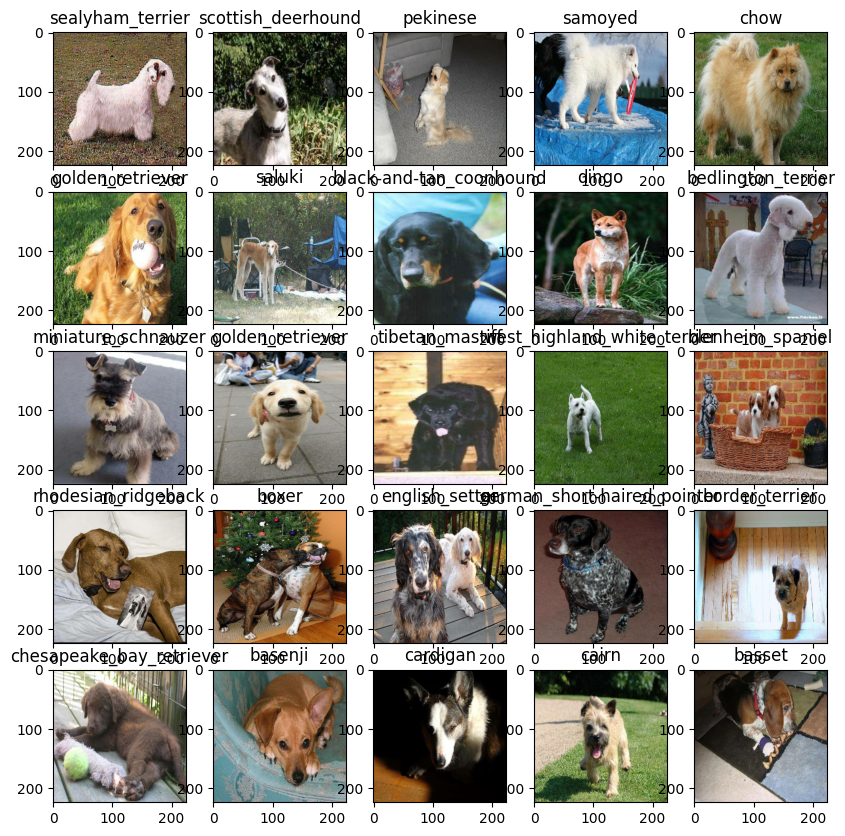

In [164]:
# Visualize the data in a training batch
train_images, train_labels =next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

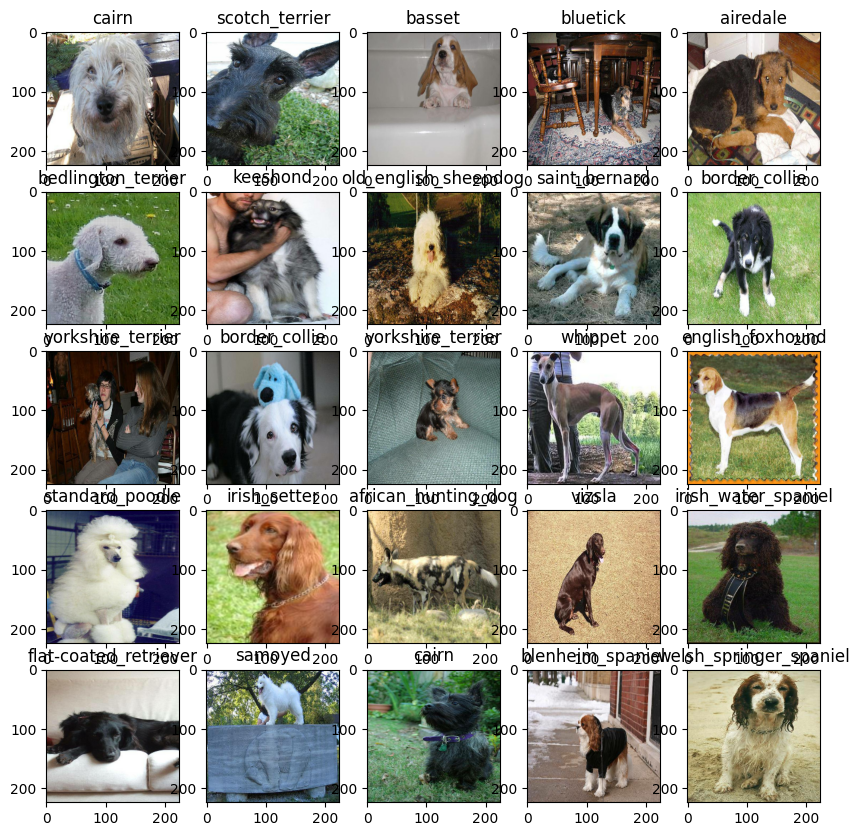

In [165]:
# Visualizing the validation set
val_images , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

The input shape (images, in the form of Tensors) to our model.

The output shape (image labels, in the form of Tensors) of our model.

The URL of the model we want to use.

In [166]:
# Setup input shape to the model
INPUT_SHAPE=[None, IMG_SIZE,IMG_SIZE,3] #batch ,height,width,colour channels

# Set up output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

# Set up model URL from TensorFlow Hub
# MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-128-classification/versions/2"
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Putting inputs and outputs into a keras deep learning model

Creating a Function which

* Takes the input shape,output shape and the model we've chosen as parameters
* Defines the layers in a keras model in sequential fashion
* Compiles the model
* Builds the model
* Returns the model

In [167]:
#Creating a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  #Set up the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),# input_layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Output layer
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Build the model
  model.build(INPUT_SHAPE)

  return model



In [168]:
model= create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_5 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_5 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Creating Callbacks

Callbacks are helps functions a model can be use during training to do such things as save its progress, check its progress or stop training early if a model stops improving

TensorBoard callback
* Load the TensorBoard notebook extension
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our models fit() function.
* Visualize our models training logs with the %tensorboard magic function


In [169]:
# Load TensorBoard notebook extension
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [170]:
import datetime

#creating a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/MyDrive/DogVision/logs",
                      # make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

# Early stopping Callback
Early stopping callback helps to stop model from overfitting by stopping training if a certain evaluation metric stops improving.

In [171]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuarcy",patience=3)

# Training a model (On subset of data)
* Train on 1000 images


In [172]:
NUM_EPOCHS=100  #@param {type:"slider",min:10,max:100,step=10}


Creating a function which trains a model

* Creating a model using create_model()
* Setup a Tensorboard callback using create_tensorboard_callback
* Call the fit() function on our model passing it the training data, validation data ,number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [173]:
# Building a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained model
  """
  # Create a model
  model=create_model()

  # craete new TensoeBoard session everytime we train a model
  tensorboard= create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  #Return the fitted model
  return model

In [174]:
#Fit the model to the data
model=train_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - ETA: 0s - loss: 4.5737 - accuracy: 0.1063

25/25 [==============================] - 7s 131ms/step - loss: 4.5737 - accuracy: 0.1063 - val_loss: 3.4495 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - ETA: 0s - loss: 1.6660 - accuracy: 0.6775

25/25 [==============================] - 3s 140ms/step - loss: 1.6660 - accuracy: 0.6775 - val_loss: 2.1887 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - ETA: 0s - loss: 0.5923 - accuracy: 0.9350

25/25 [==============================] - 4s 152ms/step - loss: 0.5923 - accuracy: 0.9350 - val_loss: 1.7027 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - ETA: 0s - loss: 0.2694 - accuracy: 0.9800

25/25 [==============================] - 3s 120ms/step - loss: 0.2694 - accuracy: 0.9800 - val_loss: 1.5192 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - ETA: 0s - loss: 0.1528 - accuracy: 0.9962

25/25 [==============================] - 4s 164ms/step - loss: 0.1528 - accuracy: 0.9962 - val_loss: 1.4280 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - ETA: 0s - loss: 0.1025 - accuracy: 1.0000

25/25 [==============================] - 3s 120ms/step - loss: 0.1025 - accuracy: 1.0000 - val_loss: 1.3693 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] - ETA: 0s - loss: 0.0768 - accuracy: 1.0000

25/25 [==============================] - 4s 158ms/step - loss: 0.0768 - accuracy: 1.0000 - val_loss: 1.3404 - val_accuracy: 0.6750
Epoch 8/100
25/25 [==============================] - ETA: 0s - loss: 0.0608 - accuracy: 1.0000

25/25 [==============================] - 3s 131ms/step - loss: 0.0608 - accuracy: 1.0000 - val_loss: 1.3195 - val_accuracy: 0.6700
Epoch 9/100
25/25 [==============================] - ETA: 0s - loss: 0.0499 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0499 - accuracy: 1.0000 - val_loss: 1.3084 - val_accuracy: 0.6650
Epoch 10/100
25/25 [==============================] - ETA: 0s - loss: 0.0418 - accuracy: 1.0000

25/25 [==============================] - 4s 147ms/step - loss: 0.0418 - accuracy: 1.0000 - val_loss: 1.2950 - val_accuracy: 0.6700
Epoch 11/100
25/25 [==============================] - ETA: 0s - loss: 0.0358 - accuracy: 1.0000

25/25 [==============================] - 4s 156ms/step - loss: 0.0358 - accuracy: 1.0000 - val_loss: 1.2816 - val_accuracy: 0.6750
Epoch 12/100
25/25 [==============================] - ETA: 0s - loss: 0.0313 - accuracy: 1.0000

25/25 [==============================] - 3s 114ms/step - loss: 0.0313 - accuracy: 1.0000 - val_loss: 1.2731 - val_accuracy: 0.6750
Epoch 13/100
25/25 [==============================] - ETA: 0s - loss: 0.0275 - accuracy: 1.0000

25/25 [==============================] - 3s 108ms/step - loss: 0.0275 - accuracy: 1.0000 - val_loss: 1.2703 - val_accuracy: 0.6700
Epoch 14/100
25/25 [==============================] - ETA: 0s - loss: 0.0245 - accuracy: 1.0000

25/25 [==============================] - 3s 112ms/step - loss: 0.0245 - accuracy: 1.0000 - val_loss: 1.2618 - val_accuracy: 0.6750
Epoch 15/100
25/25 [==============================] - ETA: 0s - loss: 0.0220 - accuracy: 1.0000

25/25 [==============================] - 4s 151ms/step - loss: 0.0220 - accuracy: 1.0000 - val_loss: 1.2542 - val_accuracy: 0.6750
Epoch 16/100
25/25 [==============================] - ETA: 0s - loss: 0.0199 - accuracy: 1.0000

25/25 [==============================] - 4s 141ms/step - loss: 0.0199 - accuracy: 1.0000 - val_loss: 1.2507 - val_accuracy: 0.6750
Epoch 17/100
25/25 [==============================] - ETA: 0s - loss: 0.0182 - accuracy: 1.0000

25/25 [==============================] - 3s 104ms/step - loss: 0.0182 - accuracy: 1.0000 - val_loss: 1.2453 - val_accuracy: 0.6750
Epoch 18/100
25/25 [==============================] - ETA: 0s - loss: 0.0166 - accuracy: 1.0000

25/25 [==============================] - 3s 138ms/step - loss: 0.0166 - accuracy: 1.0000 - val_loss: 1.2409 - val_accuracy: 0.6750
Epoch 19/100
25/25 [==============================] - ETA: 0s - loss: 0.0153 - accuracy: 1.0000

25/25 [==============================] - 3s 130ms/step - loss: 0.0153 - accuracy: 1.0000 - val_loss: 1.2380 - val_accuracy: 0.6750
Epoch 20/100
25/25 [==============================] - ETA: 0s - loss: 0.0141 - accuracy: 1.0000

25/25 [==============================] - 3s 107ms/step - loss: 0.0141 - accuracy: 1.0000 - val_loss: 1.2368 - val_accuracy: 0.6750
Epoch 21/100
25/25 [==============================] - ETA: 0s - loss: 0.0131 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0131 - accuracy: 1.0000 - val_loss: 1.2323 - val_accuracy: 0.6750
Epoch 22/100
25/25 [==============================] - ETA: 0s - loss: 0.0122 - accuracy: 1.0000

25/25 [==============================] - 3s 140ms/step - loss: 0.0122 - accuracy: 1.0000 - val_loss: 1.2312 - val_accuracy: 0.6750
Epoch 23/100
25/25 [==============================] - ETA: 0s - loss: 0.0114 - accuracy: 1.0000

25/25 [==============================] - 3s 126ms/step - loss: 0.0114 - accuracy: 1.0000 - val_loss: 1.2284 - val_accuracy: 0.6750
Epoch 24/100
25/25 [==============================] - ETA: 0s - loss: 0.0107 - accuracy: 1.0000

25/25 [==============================] - 3s 110ms/step - loss: 0.0107 - accuracy: 1.0000 - val_loss: 1.2251 - val_accuracy: 0.6750
Epoch 25/100
25/25 [==============================] - ETA: 0s - loss: 0.0100 - accuracy: 1.0000

25/25 [==============================] - 3s 113ms/step - loss: 0.0100 - accuracy: 1.0000 - val_loss: 1.2241 - val_accuracy: 0.6800
Epoch 26/100
25/25 [==============================] - ETA: 0s - loss: 0.0094 - accuracy: 1.0000

25/25 [==============================] - 4s 160ms/step - loss: 0.0094 - accuracy: 1.0000 - val_loss: 1.2237 - val_accuracy: 0.6800
Epoch 27/100
25/25 [==============================] - ETA: 0s - loss: 0.0088 - accuracy: 1.0000

25/25 [==============================] - 4s 170ms/step - loss: 0.0088 - accuracy: 1.0000 - val_loss: 1.2227 - val_accuracy: 0.6800
Epoch 28/100
25/25 [==============================] - ETA: 0s - loss: 0.0084 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0084 - accuracy: 1.0000 - val_loss: 1.2204 - val_accuracy: 0.6800
Epoch 29/100
25/25 [==============================] - ETA: 0s - loss: 0.0079 - accuracy: 1.0000

25/25 [==============================] - 3s 112ms/step - loss: 0.0079 - accuracy: 1.0000 - val_loss: 1.2196 - val_accuracy: 0.6800
Epoch 30/100
25/25 [==============================] - ETA: 0s - loss: 0.0075 - accuracy: 1.0000

25/25 [==============================] - 3s 112ms/step - loss: 0.0075 - accuracy: 1.0000 - val_loss: 1.2188 - val_accuracy: 0.6850
Epoch 31/100
25/25 [==============================] - ETA: 0s - loss: 0.0071 - accuracy: 1.0000

25/25 [==============================] - 3s 133ms/step - loss: 0.0071 - accuracy: 1.0000 - val_loss: 1.2190 - val_accuracy: 0.6800
Epoch 32/100
25/25 [==============================] - ETA: 0s - loss: 0.0068 - accuracy: 1.0000

25/25 [==============================] - 3s 112ms/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 1.2174 - val_accuracy: 0.6850
Epoch 33/100
25/25 [==============================] - ETA: 0s - loss: 0.0065 - accuracy: 1.0000

25/25 [==============================] - 3s 112ms/step - loss: 0.0065 - accuracy: 1.0000 - val_loss: 1.2165 - val_accuracy: 0.6800
Epoch 34/100
25/25 [==============================] - ETA: 0s - loss: 0.0062 - accuracy: 1.0000

25/25 [==============================] - 3s 113ms/step - loss: 0.0062 - accuracy: 1.0000 - val_loss: 1.2158 - val_accuracy: 0.6800
Epoch 35/100
25/25 [==============================] - ETA: 0s - loss: 0.0059 - accuracy: 1.0000

25/25 [==============================] - 4s 170ms/step - loss: 0.0059 - accuracy: 1.0000 - val_loss: 1.2146 - val_accuracy: 0.6850
Epoch 36/100
25/25 [==============================] - ETA: 0s - loss: 0.0056 - accuracy: 1.0000

25/25 [==============================] - 4s 140ms/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 1.2150 - val_accuracy: 0.6850
Epoch 37/100
25/25 [==============================] - ETA: 0s - loss: 0.0054 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 1.2154 - val_accuracy: 0.6800
Epoch 38/100
25/25 [==============================] - ETA: 0s - loss: 0.0051 - accuracy: 1.0000

25/25 [==============================] - 3s 138ms/step - loss: 0.0051 - accuracy: 1.0000 - val_loss: 1.2144 - val_accuracy: 0.6850
Epoch 39/100
25/25 [==============================] - ETA: 0s - loss: 0.0049 - accuracy: 1.0000

25/25 [==============================] - 3s 135ms/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 1.2144 - val_accuracy: 0.6850
Epoch 40/100
25/25 [==============================] - ETA: 0s - loss: 0.0047 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0047 - accuracy: 1.0000 - val_loss: 1.2144 - val_accuracy: 0.6900
Epoch 41/100
25/25 [==============================] - ETA: 0s - loss: 0.0046 - accuracy: 1.0000

25/25 [==============================] - 3s 110ms/step - loss: 0.0046 - accuracy: 1.0000 - val_loss: 1.2133 - val_accuracy: 0.6850
Epoch 42/100
25/25 [==============================] - ETA: 0s - loss: 0.0044 - accuracy: 1.0000

25/25 [==============================] - 3s 136ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 1.2136 - val_accuracy: 0.6900
Epoch 43/100
25/25 [==============================] - ETA: 0s - loss: 0.0042 - accuracy: 1.0000

25/25 [==============================] - 3s 124ms/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 1.2130 - val_accuracy: 0.6900
Epoch 44/100
25/25 [==============================] - ETA: 0s - loss: 0.0041 - accuracy: 1.0000

25/25 [==============================] - 3s 112ms/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 1.2130 - val_accuracy: 0.6900
Epoch 45/100
25/25 [==============================] - ETA: 0s - loss: 0.0039 - accuracy: 1.0000

25/25 [==============================] - 3s 112ms/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 1.2125 - val_accuracy: 0.6900
Epoch 46/100
25/25 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 1.0000

25/25 [==============================] - 4s 153ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 1.2114 - val_accuracy: 0.6900
Epoch 47/100
25/25 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 1.0000

25/25 [==============================] - 3s 121ms/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 1.2121 - val_accuracy: 0.6900
Epoch 48/100
25/25 [==============================] - ETA: 0s - loss: 0.0035 - accuracy: 1.0000

25/25 [==============================] - 3s 109ms/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 1.2124 - val_accuracy: 0.6900
Epoch 49/100
25/25 [==============================] - ETA: 0s - loss: 0.0034 - accuracy: 1.0000

25/25 [==============================] - 3s 113ms/step - loss: 0.0034 - accuracy: 1.0000 - val_loss: 1.2127 - val_accuracy: 0.6900
Epoch 50/100
25/25 [==============================] - ETA: 0s - loss: 0.0033 - accuracy: 1.0000

25/25 [==============================] - 4s 141ms/step - loss: 0.0033 - accuracy: 1.0000 - val_loss: 1.2116 - val_accuracy: 0.6900
Epoch 51/100
25/25 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 1.0000

25/25 [==============================] - 3s 107ms/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 1.2117 - val_accuracy: 0.6900
Epoch 52/100
25/25 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 1.0000

25/25 [==============================] - 3s 106ms/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.2123 - val_accuracy: 0.6900
Epoch 53/100
25/25 [==============================] - ETA: 0s - loss: 0.0030 - accuracy: 1.0000

25/25 [==============================] - 4s 151ms/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 1.2127 - val_accuracy: 0.6900
Epoch 54/100
25/25 [==============================] - ETA: 0s - loss: 0.0029 - accuracy: 1.0000

25/25 [==============================] - 4s 148ms/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 1.2129 - val_accuracy: 0.6900
Epoch 55/100
25/25 [==============================] - ETA: 0s - loss: 0.0028 - accuracy: 1.0000

25/25 [==============================] - 3s 110ms/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 1.2133 - val_accuracy: 0.6900
Epoch 56/100
25/25 [==============================] - ETA: 0s - loss: 0.0027 - accuracy: 1.0000

25/25 [==============================] - 3s 105ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 1.2127 - val_accuracy: 0.6900
Epoch 57/100
25/25 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 1.0000

25/25 [==============================] - 4s 175ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 1.2130 - val_accuracy: 0.6900
Epoch 58/100
25/25 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 1.0000

25/25 [==============================] - 3s 120ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 1.2135 - val_accuracy: 0.6900
Epoch 59/100
25/25 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 1.2134 - val_accuracy: 0.6900
Epoch 60/100
25/25 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 1.0000

25/25 [==============================] - 4s 164ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 1.2131 - val_accuracy: 0.6900
Epoch 61/100
25/25 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.0000

25/25 [==============================] - 4s 144ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 1.2136 - val_accuracy: 0.6900
Epoch 62/100
25/25 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 1.0000

25/25 [==============================] - 3s 110ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 1.2151 - val_accuracy: 0.6900
Epoch 63/100
25/25 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.0000

25/25 [==============================] - 3s 114ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 1.2134 - val_accuracy: 0.6900
Epoch 64/100
25/25 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 1.0000

25/25 [==============================] - 3s 115ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 1.2140 - val_accuracy: 0.6900
Epoch 65/100
25/25 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.0000

25/25 [==============================] - 4s 161ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.2136 - val_accuracy: 0.6900
Epoch 66/100
25/25 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.0000

25/25 [==============================] - 4s 174ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.2139 - val_accuracy: 0.6900
Epoch 67/100
25/25 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.2151 - val_accuracy: 0.6900
Epoch 68/100
25/25 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.0000

25/25 [==============================] - 3s 107ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 1.2150 - val_accuracy: 0.6900
Epoch 69/100
25/25 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.0000

25/25 [==============================] - 4s 171ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 1.2156 - val_accuracy: 0.6900
Epoch 70/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.2153 - val_accuracy: 0.6900
Epoch 71/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.0000

25/25 [==============================] - 3s 108ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.2160 - val_accuracy: 0.6900
Epoch 72/100
25/25 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.0000

25/25 [==============================] - 4s 142ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.2159 - val_accuracy: 0.6900
Epoch 73/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000

25/25 [==============================] - 4s 170ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.2165 - val_accuracy: 0.6900
Epoch 74/100
25/25 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000

25/25 [==============================] - 3s 110ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.2169 - val_accuracy: 0.6950
Epoch 75/100
25/25 [==============================] - ETA: 0s - loss: 0.0016 - accuracy: 1.0000

25/25 [==============================] - 3s 110ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 1.2174 - val_accuracy: 0.6950
Epoch 76/100
25/25 [==============================] - ETA: 0s - loss: 0.0016 - accuracy: 1.0000

25/25 [==============================] - 3s 108ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 1.2166 - val_accuracy: 0.6900
Epoch 77/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 1.0000

25/25 [==============================] - 4s 164ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 1.2173 - val_accuracy: 0.6950
Epoch 78/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 1.0000

25/25 [==============================] - 4s 150ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 1.2175 - val_accuracy: 0.6950
Epoch 79/100
25/25 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 1.0000

25/25 [==============================] - 3s 112ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 1.2178 - val_accuracy: 0.6950
Epoch 80/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.0000

25/25 [==============================] - 3s 113ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.2180 - val_accuracy: 0.6950
Epoch 81/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.0000

25/25 [==============================] - 3s 109ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.2184 - val_accuracy: 0.6950
Epoch 82/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.0000

25/25 [==============================] - 4s 175ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.2192 - val_accuracy: 0.6950
Epoch 83/100
25/25 [==============================] - ETA: 0s - loss: 0.0014 - accuracy: 1.0000

25/25 [==============================] - 3s 133ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.2186 - val_accuracy: 0.6950
Epoch 84/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - accuracy: 1.0000

25/25 [==============================] - 3s 110ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.2195 - val_accuracy: 0.6950
Epoch 85/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.2195 - val_accuracy: 0.6950
Epoch 86/100
25/25 [==============================] - ETA: 0s - loss: 0.0013 - accuracy: 1.0000

25/25 [==============================] - 4s 149ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.2204 - val_accuracy: 0.6950
Epoch 87/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.0000

25/25 [==============================] - 4s 154ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.2202 - val_accuracy: 0.6950
Epoch 88/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.0000

25/25 [==============================] - 3s 113ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.2208 - val_accuracy: 0.6950
Epoch 89/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.0000

25/25 [==============================] - 3s 111ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.2211 - val_accuracy: 0.6950
Epoch 90/100
25/25 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.0000

25/25 [==============================] - 3s 118ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.2215 - val_accuracy: 0.6950
Epoch 91/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.0000

25/25 [==============================] - 6s 246ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.2221 - val_accuracy: 0.6950
Epoch 92/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.0000

25/25 [==============================] - 4s 169ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.2224 - val_accuracy: 0.6950
Epoch 93/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.0000

25/25 [==============================] - 4s 159ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.2226 - val_accuracy: 0.6950
Epoch 94/100
25/25 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 1.0000

25/25 [==============================] - 3s 138ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.2232 - val_accuracy: 0.6950
Epoch 95/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - accuracy: 1.0000

25/25 [==============================] - 4s 175ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.2232 - val_accuracy: 0.6950
Epoch 96/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - accuracy: 1.0000

25/25 [==============================] - 4s 152ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.2233 - val_accuracy: 0.6950
Epoch 97/100
25/25 [==============================] - ETA: 0s - loss: 0.0010 - accuracy: 1.0000

25/25 [==============================] - 4s 174ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.2240 - val_accuracy: 0.6950
Epoch 98/100
25/25 [==============================] - ETA: 0s - loss: 9.8383e-04 - accuracy: 1.0000

25/25 [==============================] - 4s 152ms/step - loss: 9.8383e-04 - accuracy: 1.0000 - val_loss: 1.2244 - val_accuracy: 0.6950
Epoch 99/100
25/25 [==============================] - ETA: 0s - loss: 9.6390e-04 - accuracy: 1.0000

25/25 [==============================] - 4s 172ms/step - loss: 9.6390e-04 - accuracy: 1.0000 - val_loss: 1.2246 - val_accuracy: 0.6950
Epoch 100/100
25/25 [==============================] - ETA: 0s - loss: 9.4523e-04 - accuracy: 1.0000

25/25 [==============================] - 3s 110ms/step - loss: 9.4523e-04 - accuracy: 1.0000 - val_loss: 1.2246 - val_accuracy: 0.6950


# Making and Evaluating predictions using training model

In [175]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [176]:
# Make predictions on the validation data (notused to train on)
predictions= model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 1s 87ms/step


array([[2.86012975e-04, 2.88149681e-06, 3.23259225e-03, ...,
        6.49847498e-05, 1.14972943e-06, 7.04963677e-05],
       [1.86467398e-04, 7.32944754e-05, 1.43996254e-03, ...,
        2.48478118e-05, 4.24282880e-05, 1.69218595e-06],
       [2.04059827e-08, 1.16422520e-07, 8.19784916e-08, ...,
        4.61967318e-07, 2.90261198e-07, 1.72959953e-05],
       ...,
       [1.19125474e-07, 9.19582249e-07, 3.87048976e-06, ...,
        3.60598847e-07, 4.54818974e-06, 2.62085678e-07],
       [2.97800498e-03, 2.73692549e-05, 9.34016680e-06, ...,
        1.20372988e-05, 4.34963340e-06, 2.51829321e-03],
       [3.89846828e-05, 5.89431602e-06, 6.56245757e-05, ...,
        2.05460005e-03, 1.60121257e-04, 1.37342004e-05]], dtype=float32)

In [177]:
predictions.shape

(200, 120)

In [178]:
# First Predictions
index=0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted  label: {unique_breeds[np.argmax(predictions[index])]}")

[2.86012975e-04 2.88149681e-06 3.23259225e-03 1.34857219e-05
 6.53188472e-05 5.60495027e-06 6.96967961e-03 1.85309982e-04
 4.08656842e-06 1.73422857e-04 1.13169743e-04 2.13723251e-05
 9.26978973e-05 3.11347067e-05 8.74631369e-05 5.50995355e-05
 9.17773104e-06 9.15868431e-02 6.31130376e-07 1.14334225e-05
 1.35204842e-04 2.19479953e-05 1.72657724e-06 4.83226700e-04
 4.47022671e-07 4.01550733e-06 4.50278819e-01 4.05550145e-06
 2.04385738e-04 5.15377178e-06 1.55027228e-05 3.07184266e-04
 5.47891723e-05 2.52796417e-06 2.09111713e-05 1.72183439e-02
 3.91374442e-06 1.19034630e-04 1.32400282e-05 1.07824162e-05
 6.48909263e-05 8.49859225e-06 4.11277360e-05 2.57349438e-05
 3.74133720e-06 6.43532912e-05 5.11929602e-06 4.57740498e-05
 3.53016716e-04 1.22947431e-05 1.03690118e-05 5.00360284e-06
 1.33347357e-05 7.55220390e-06 2.49389632e-06 1.14316999e-05
 3.19525170e-05 3.72601207e-04 1.79033377e-04 9.46782306e-02
 1.26071667e-04 2.23406505e-06 4.24220838e-04 5.95060783e-06
 1.33465437e-05 1.248161

In [179]:
# Turning the probability to respective label

def get_pred_label(prediction_probabilities):
  """
  Turns an array of predictions probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

  #Getting a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Validation data is in a batch dataset, we will have to unbatchify it to make predictions on the validation images and the compare those predictions to the validation labels( truth value)

In [180]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [181]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensor and returns seperate arrays of images and labels.
  """
  images=[]
  labels=[]
  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images,val_labels= unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Creating a function to visualizing
* Takes an array of probabilities ,an array of truth labels and array of images and integer
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability the truth label and target image on a single plot


In [182]:
def plot_pred(prediction_probabilities,labels,images,n=23):
  """
  View the prediction,ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  #Get the pred label
  pred_label =get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the colour of the title depending on if the prediction is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"


  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{}{:2.0f}% {}".format(pred_label ,
                                   np.max(pred_prob)*100,true_label),color=color)

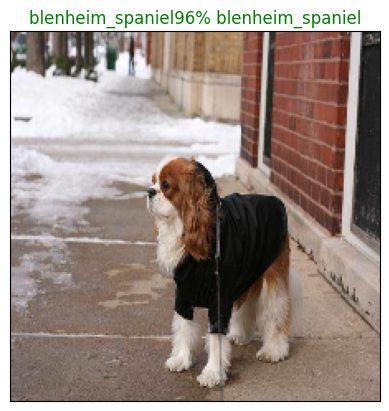

In [183]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Creating Function to visualize Models top predictions

* Taking an input of predictions probabilities' arrray and a ground truth array and an integer
* Finding the predictions using get_pred-label()
* Prediction probabilities indexes
* Prediction probabilities values
* predicting labels


In [184]:
import matplotlib.pyplot as plt

def plot_pred_conf(prediction_probabilities,labels,n=1):

  """
  Plus the top 10 highest prediction confidences along with the label for sample n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label=get_pred_label(pred_prob)

  #Finding the top 10 prediction confidence indexes
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]

  # Finding the top 10 prediction confidense values
  top_10_pred_values= pred_prob[top_10_pred_indexes]

  # Finding the top 10 prediction labels
  top_10_pred_labels= unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                            top_10_pred_values,
                            color= "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass


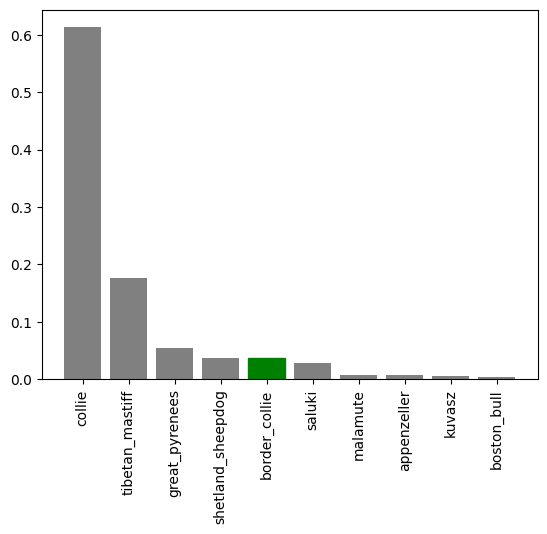

In [185]:
import matplotlib.pyplot as plt

plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

# Saving and reloading model



In [186]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/DogVision/model",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [187]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [188]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/DogVision/model/20231204-13551701698115-1000-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogVision/model/20231204-13551701698115-1000-images-Adam.h5'

In [199]:
# Load our model trained on 1000 images
model_1000_images = load_model("drive/MyDrive/DogVision/model/20231204-13551701698115-1000-images-Adam.h5")

Loading saved model from: drive/MyDrive/DogVision/model/20231204-13551701698115-1000-images-Adam.h5


Compare the two models (the original one and loaded one). We can do so easily using the evaluate() method.

In [200]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 113ms/step - loss: 1.2246 - accuracy: 0.6950


[1.2245570421218872, 0.6949999928474426]

In [201]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 79ms/step - loss: 1.2246 - accuracy: 0.6950


[1.2245570421218872, 0.6949999928474426]

# Training Model (On the full data)

In [192]:
len(X), len(y)

(10222, 10222)

In [202]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training data batches


In [203]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [204]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [205]:
%tensorboard --logdir drive/My\Drive/DogVision/logs

<IPython.core.display.Javascript object>

In [206]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 72s 101ms/step - loss: 1.3330 - accuracy: 0.6700
Epoch 2/100
320/320 [==============================] - 31s 97ms/step - loss: 0.4047 - accuracy: 0.8810
Epoch 3/100
320/320 [==============================] - 32s 99ms/step - loss: 0.2402 - accuracy: 0.9358
Epoch 4/100
320/320 [==============================] - 31s 97ms/step - loss: 0.1527 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 32s 100ms/step - loss: 0.1061 - accuracy: 0.9781
Epoch 6/100
320/320 [==============================] - 32s 99ms/step - loss: 0.0768 - accuracy: 0.9880
Epoch 7/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0593 - accuracy: 0.9908
Epoch 8/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0469 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 31s 97ms/step - loss: 0.0376 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 32s 99ms/step 

# Saving and reloading the full model

In [207]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/MyDrive/DogVision/model/20231204-14201701699657-all-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogVision/model/20231204-14201701699657-all-images-Adam.h5'

In [208]:
# Loadind in the full model
loaded_full_model=load_model("drive/MyDrive/DogVision/model/20231204-14201701699657-all-images-Adam.h5")

Loading saved model from: drive/MyDrive/DogVision/model/20231204-14201701699657-all-images-Adam.h5


Making predictions on the test dataset

In [215]:
# Get custom image filepaths
test_path = "drive/MyDrive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/DogVision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/DogVision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/DogVision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/DogVision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/DogVision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/DogVision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/DogVision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/DogVision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/DogVision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/MyDrive/DogVision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [216]:
len(test_filenames)

10357

In [217]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [218]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 44s 135ms/step


In [219]:
# Check out the test predictions
test_predictions[:10]

array([[5.93412212e-12, 2.15272917e-12, 6.55691084e-15, ...,
        2.33344041e-14, 6.07218512e-11, 3.69496057e-12],
       [3.46266262e-07, 1.53494273e-06, 4.09729353e-08, ...,
        2.36929781e-11, 2.75292251e-07, 4.41726544e-10],
       [5.89353150e-11, 5.54995268e-07, 1.06442934e-08, ...,
        3.53789034e-08, 7.58848887e-11, 5.23743635e-12],
       ...,
       [2.81384777e-10, 1.98215819e-10, 8.31330907e-11, ...,
        4.63783688e-13, 2.20946308e-12, 5.93472710e-12],
       [2.06484881e-11, 7.42255632e-11, 2.62798221e-11, ...,
        6.54214034e-08, 1.01292341e-09, 1.08978104e-11],
       [4.93356411e-10, 2.13448465e-12, 1.02506380e-11, ...,
        5.65770677e-14, 1.26186464e-12, 6.65432154e-08]], dtype=float32)

# Making predictions on custom images

In [223]:
# Get custom image filepaths
custom_path = "drive/My Drive/DogVision/dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [224]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches


In [225]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 690ms/step


In [226]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pug', 'samoyed', 'pembroke']

In [227]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

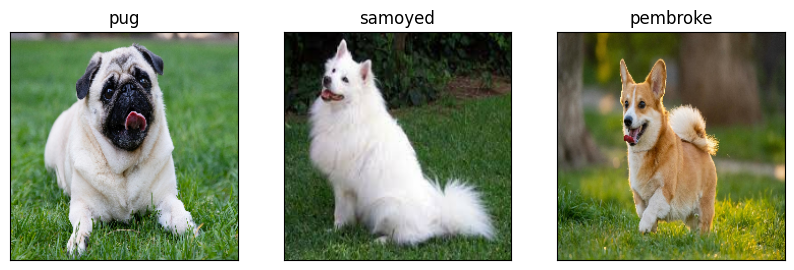

In [228]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)